# Investment property in Minneapolis Neighborhood
## Introduction
### Description & Discussion of the Background

Minneapolis is a city located in Hennepin County. Minnesota, which is along the bank of the Mississippi River, is the largest city in Minnesota with the most recent population of 437,069, and is the 45th  largest city in the U.S. It is the 16th largest metropolitan area in the United States. Minneapolis is currently growing at a rate of 1.35% annually.  With over 58 square miles, Minneapolis has a population density of 8,094 per square mile. The 2020 census information shows that the Twin Cities area has gained over 60,000 people since 2010 and Minneapolis is leading the growth.

Minneapolis is surrounded by lakes, creeks, and waterfalls, which are connected by parkways in the chain of lakes, and the grand round national scenic byways. Due to its ease of access, the city is ranked by having the best park system in the U.S., it is also known to be the best bike-friendly city in the United States. The city hosts various arts scenes, performing arts venues, and sporting events in three stadiums. The variety of options for cuisine, fine dining, and local foods are all around the city. Minneapolis is the major financial center. It is the 3rd largest economic center in the Midwest. The twin city metropolitan area has the 5th highest concentration of major corporate headquarters in the country which makes it the 15th richest city in the U.S. (See Wikipedia for more information: https://en.wikipedia.org/wiki/Minneapolis)

The fact that Minneapolis is a home to big corporations, presents various employment opportunities in the city. Besides, its rich environment makes it a desirable place to work and live. Consequently, the Minneapolis housing market is very competitive which attracts many investors to own investment property, such as a rental unit. The problem is, Minneapolis has 87 neighborhoods and is known to be the 3rd most expensive city in North America. From the investors point of view, it is desired to own a rental property with the following characteristics. Firstly, the location of the property is in a safe neighborhood where a reasonable commute to the center of the city is expected. Next, the property is priced reasonably. Lastly, it would be a plus if a neighborhood consists of assorted venues to accommodate various lifestyles. Many websites offer different aspects to Minneapolis neighborhoods, but it takes a long time for investors to review, analyze, and summarize them. Therefore, this research is an attempt to solve a problem for investors to identify the best Minneapolis neighborhood to own a rental property. The Foursquare location data is utilized to examine the proximity to the center of the city and the venues of each neighborhood in Minneapolis in conjunction with crime data and home price data obtained from Open Minneapolis and Zillow, respectively. 

## Data
### Data Sources

Four different data sources are used in this study. 
1.	The data containing name and geographical coordinates of Minneapolis neighborhoods is retrieved from Open Minneapolis site:
https://opendata.arcgis.com/datasets/055ca54e5fcc47329f081c9ef51d038e_0.geojson

2.	The crime data per Minneapolis neighborhood in 2018 is retrieved from Open Minneapolis site: 
http://opendata.minneapolismn.gov/datasets/police-incidents-2018-pims/data

3.	The median home price in Minneapolis data in 2020 is obtained from Zillow site: https://www.zillow.com/minneapolis-mn/home-values/

4.	Foursquare location data of Minneapolis is retrieved from the site:
https://foursquare.com/developers/apps

### Data cleaning process

In [183]:
import pandas as pd
import numpy as np
import requests
import geocoder
from geopy.geocoders import Nominatim
import json
from pandas.io.json import json_normalize
import matplotlib.cm as cm
from sklearn.cluster import KMeans
import folium
from sklearn import preprocessing
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import geopy.distance

#### 1. Minneapolis Neighborhood Data
The neighbobhood data is retrived and downloaded from Open Minneapolis website:http://opendata.minneapolismn.gov/datasets/minneapolis-neighborhoods/data?geometry=-93.725%2C44.886%2C-92.798%2C45.056. The neighborhood data is then cleaned to contain the necessary columns, i.e., neighborhood name, its associated neighborhood number and geographical information. There are 87 neighborhoods in Minneapolis. 

In [2]:
df=pd.read_csv('..input\\Minneapolis_Neighborhoods.csv')
neigh=df[['BDNAME','BDNUM']]
neigh=neigh.rename(columns={'BDNAME':'Neighborhood','BDNUM':'no'})

In [3]:
neigh.head()

,Neighborhood,no
0,Phillips West,90
1,Downtown West,87
2,Downtown East,88
3,Ventura Village,89
4,Sumner - Glenwood,29


In [4]:
neigh.shape

(87, 2)

#### 2. Crime data
The crime data is retrieved and downloaded from Open Minneapolis website:http://opendata.minneapolismn.gov/datasets/police-incidents-2018-pims. The crime data is cleaned to include only the necessary information, i.e., decription of the offense, longitude, latitude, and the name of the neighborhoods.

In [21]:
df=pd.read_csv('..input\\Police_Incidents_2018_PIMS.csv')

In [22]:
crime=df[['description','centerLong','centerLat','neighborhood']]
crime=crime.rename(columns={'centerLong':'longitude','centerLat':'latitude','neighborhood':'Neighborhood'})

In [23]:
crime.shape

(11604, 4)

There were 11,604 reported incidents across Minneapolis neighborhoods in 2018. Next, the nieghborhood data and crime data are combined by the name of the neighborhoods. It is found that three cases have missing neighborhood name. Since missing neighborhood name cannot be identified, these three cases are deleted from the further analysis.

In [24]:
mn=pd.merge(neigh, crime, on = 'Neighborhood', how='right')

In [25]:
ch=mn.no.isna()
ch.value_counts()

False    11601
True         3
Name: no, dtype: int64

In [26]:
ch.isnull().sum()

0

In [27]:
mn=pd.merge(neigh, crime, on = 'Neighborhood', how='left')
mn.shape

(11601, 5)

In [28]:
crime=mn.drop_duplicates(subset = ["description"])
crime.shape

(33, 5)

#### 3. Home price data
The home price data and rental data are retrievecd and downloaded from Zillow website: https://www.zillow.com/minneapolis-mn/home-values/. The home price of all types is used in this study.  

In [29]:
df=pd.read_csv('..input\\minneapolis-mn.csv')

In [30]:
df.shape

(85, 2)

In [31]:
mn=pd.merge(mn,df, on = 'Neighborhood', how='left')

In [32]:
ch=mn.price.isna()
ch.value_counts()

False    11536
True        65
Name: price, dtype: int64

In [33]:
ch.isnull().sum()

0

In [34]:
ch2=mn.loc[mn['price'].isna()]

In [35]:
ch2.Neighborhood.value_counts()

Mid - City Industrial       54
Camden Industrial            9
Humboldt Industrial Area     2
Name: Neighborhood, dtype: int64

It is found that three city industrial areas, i.e. Mid-City Industrial, Camden Industrial and Humboldt Industrial Area, do not have any home sale information which is expected. Therefore, the final data includes 11,601 total numbber of incidents dealing with 33 different crime types across 87 Minneapolis neighborhoods. 

In [73]:
sites=mn.drop_duplicates(subset ='Neighborhood', keep = 'first') 
sites.sort_values('Neighborhood')
sites=sites.drop(['no', 'description'], axis=1)

In [97]:
tots=mn.groupby('Neighborhood').size().sort_values(ascending=True).to_frame()
tots.rename(columns={0:'total'}, inplace=True)

In [100]:
sites=pd.merge(sites, tots, on='Neighborhood', how='left')

#### 4. Foursquare location data
Foursquare API is used to find the venue information in each of Minneapolis neighborhoods. It is to understand the characteristics of the Minneapolis neighborhoods. First, the venues across all 87 Minneapolis neighborhoods are imported.

In [205]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results0=requests.get(url).json()
        results=results0['response']['groups'][0]['items']
       # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list 
                                  for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [206]:
mn_venues=getNearbyVenues(names=sites['Neighborhood'].to_list(),
                                latitudes=sites['latitude'].to_list(),
                                longitudes=sites['longitude'].to_list())
mn_venues.shape

Phillips West
Downtown West
Downtown East
Ventura Village
Sumner - Glenwood
Shingle Creek
Lind - Bohanon
Webber - Camden
Bottineau
Victory
Humboldt Industrial Area
Howe
Hiawatha
Windom
Ericsson
Field
Page
Como
Cedar Riverside
Prospect Park - East River Road
University of Minnesota
Jordan
Hawthorne
Willard - Hay
Near - North
Harrison
Loring Park
Steven's Square - Loring Heights
Minnehaha
Diamond Lake
Cooper
Tangletown
North Loop
Hale
Keewaydin
Fulton
Lynnhurst
Bancroft
Standish
Seward
Longfellow
Lowry Hill East
ECCO
South Uptown
East Phillips
Cleveland
Wenonah
Holland
Audubon Park
Regina
Northrop
Sheridan
Logan Park
Windom Park
Linden Hills
East Harriet
King Field
Morris Park
Mid - City Industrial
Midtown Phillips
West Calhoun
Bryn - Mawr
Northeast Park
St. Anthony West
St. Anthony East
Central
Powderhorn Park
Corcoran
Bryant
Kenny
Armatage
Beltrami
Cedar - Isles - Dean
Kenwood
Lowry Hill
East Isles
Elliot Park
Nicollet Island - East Bank
Marcy Holmes
Folwell
McKinley
Camden Industrial


(1593, 7)

In [207]:
vcount=mn_venues.groupby('Neighborhood').count()
print('There are {} unique categories.'.format(len(mn_venues['Venue Category'].unique())))

There are 250 unique categories.


Across 87 Minneapolis neighborhoods, there are 250 different venue categories, which implies that the city's venues are diverse. Next, top 10 popular venues in each neighborhood are observed. 

In [208]:
vcount.sort_values('Venue', ascending=False, inplace=True)

In [209]:
mn_onehot=pd.get_dummies(mn_venues[['Venue Category']], prefix='', prefix_sep='')
mn_onehot['Neighborhood']=mn_venues['Neighborhood']
fixed_columns=[mn_onehot.columns[-1]]+list(mn_onehot.columns[:-1])
mn_onehot=mn_onehot[fixed_columns]
mn_onehot.head()

,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,African Restaurant,American Restaurant,Antique Shop,Arcade,...,Train,Train Station,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Phillips West,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Phillips West,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Phillips West,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Phillips West,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Phillips West,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [210]:
mn_onehot.shape

(1593, 251)

In [211]:
mn_grouped=mn_onehot.groupby("Neighborhood").sum().reset_index()
mn_grouped.shape

(87, 251)

In [81]:
#top 10 in neighborhood
def return_most_common_venues(row,num_top_venues):
    row_categories=row.iloc[1:]
    row_categories_sorted=row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

In [212]:
num_top_venues=10
indicators=['st','nd','rd']
columns=['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1,indicator[ind]))
    except:
        columns.append('{}th Most common Venue'.format(ind+1))
neighborhoods_venues_sorted=pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood']=mn_grouped['Neighborhood']
for ind in np.arange(mn_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(mn_grouped.iloc[ind, :], 
                              num_top_venues)
neighborhoods_venues_sorted.head()

,Neighborhood,1th Most common Venue,2th Most common Venue,3th Most common Venue,4th Most common Venue,5th Most common Venue,6th Most common Venue,7th Most common Venue,8th Most common Venue,9th Most common Venue,10th Most common Venue
0,Armatage,Playground,Trail,French Restaurant,Pizza Place,Hospital,English Restaurant,Football Stadium,Food Truck,Food Court,Food & Drink Shop
1,Audubon Park,Convenience Store,Boat or Ferry,Vietnamese Restaurant,Restaurant,Park,Food,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flower Shop
2,Bancroft,Ice Cream Shop,Garden Center,Food & Drink Shop,Caribbean Restaurant,Candy Store,Liquor Store,Flower Shop,Coffee Shop,Gym / Fitness Center,Antique Shop
3,Beltrami,Playground,Asian Restaurant,Brewery,Bus Station,Gay Bar,Liquor Store,Café,Chinese Restaurant,Karaoke Bar,Skate Park
4,Bottineau,Park,Convenience Store,Dive Bar,Liquor Store,Persian Restaurant,Speakeasy,German Restaurant,New American Restaurant,Steakhouse,Karaoke Bar


In [213]:
neighborhoods_venues_sorted.shape

(87, 11)

The venues information is combined with the crime and home price data. Since the data seems to be too sparse and some of the venues are preseted with various names, i.e., Café and Coffee Shop. Some venues are found less than ten times across neighborhoods. Therefore, some of the features are combined and chosen based on the frequency. The combined venues are grouped as below: 

In [84]:
mn_grouped['art']=mn_grouped[['Art Gallery','Art Museum']].sum(axis=1)
mn_grouped['bakery'] = mn_grouped[['Bagel Shop','Bakery', 'Donut Shop', 'Pastry Shop']].sum(axis=1)
mn_grouped['deli'] = mn_grouped[['Deli / Bodega', 'Sandwich Place']].sum(axis=1)
mn_grouped['shopping']=mn_grouped[['Boutique','Clothing Store', "Men's Store","Women's Store", 
                                   'Shoe Store', 'Shopping Mall', 'Shopping Plaza', 'Department Store', 'Discount Store', 
                                   'Optical Shop', 'Sporting Goods Shop', 'Toy / Game Store']].sum(axis=1)
mn_grouped['coffee']=mn_grouped[['Café','Coffee Shop', 'Bubble Tea Shop','Juice Bar', 'Tea Room']].sum(axis=1)
mn_grouped['fastfood']=mn_grouped[['Fast Food Restaurant','Fried Chicken Joint']].sum(axis=1)
mn_grouped['grocery']=mn_grouped[['Grocery Store', 'Supermarket','Market', 'Gourmet Shop',
                                 'Convenience Store', 'Food & Drink Shop', 'Farmers Market']].sum(axis=1)
mn_grouped['gym']=mn_grouped[['Climbing Gym','Gym','Gym / Fitness Center','Sports Club',
                              'Dance Studio', 'Pilates Studio', 'Yoga Studio']].sum(axis=1)
mn_grouped['icecream']=mn_grouped[['Dessert Shop', 'Ice Cream Shop','Frozen Yogurt Shop' ]].sum(axis=1)
mn_grouped['music']=mn_grouped[['Concert Hall', 'Music Venue', 'Opera House', 'Rock Club']].sum(axis=1)
mn_grouped['park']=mn_grouped[['Garden', 'Outdoors & Recreation', 'Park', 'Sculpture Garden', 'Trail',
                               'Playground','Lake', 'Other Great Outdoors', 'Scenic Lookout', 'Historic Site' ]].sum(axis=1)
mn_grouped['transit']=mn_grouped[['Bus Station', 'Bus Stop', 'Light Rail Station', 'Train', 'Train Station','Platform']].sum(axis=1)
mn_grouped['theater']=mn_grouped[['Indie Theater', 'Performing Arts Venue', 'Theater', 'Comedy Club']].sum(axis=1)
mn_grouped['restaurant']=mn_grouped[['Restaurant', 'Seafood Restaurant', 'Southern / Soul Food Restaurant', 'Vegetarian / Vegan Restaurant',
                        'Comfort Food Restaurant','Gluten-free Restaurant', 'Noodle House','Steakhouse', 'Burger Joint',
                        'Diner', 'BBQ Joint', 'Gastropub', 'Irish Pub','Pub', 'Breakfast Spot',
                        'Asian Restaurant','American Restaurant', 'Chinese Restaurant','Italian Restaurant',
                        'Mexican Restaurant','Pizza Place','Vietnamese Restaurant','Japanese Restaurant', 
                        'Ramen Restaurant', 'Sushi Restaurant', 'Hotpot Restaurant', 
                        'Food Court', 'Hot Dog Joint', 'African Restaurant', 'Asian Restaurant', 'Caribbean Restaurant',
                        'Eastern European Restaurant', 'English Restaurant', 'Falafel Restaurant', 'German Restaurant',
                        'Greek Restaurant', 'Himalayan Restaurant', 'Indian Restaurant', 'Italian Restaurant', 'Jewish Restaurant',
'Korean Restaurant', 'Latin American Restaurant', 'Mediterranean Restaurant', 'Mexican Restaurant', 'Middle Eastern Restaurant',                                  
'New American Restaurant', 'Persian Restaurant', 'Scandinavian Restaurant', 'Taco Place', 'Thai Restaurant',
'Vietnamese Restaurant', 'Pizza Place'                 ]].sum(axis=1)
mn_grouped['arena']=mn_grouped[['Baseball Field', 'Baseball Stadium', 'Football Stadium', 'Hockey Arena', 
                                'Soccer Field', 'Soccer Stadium']].sum(axis=1)
mn_grouped['bar']=mn_grouped[['Bar', 'Beer Bar', 'Beer Garden', 'Cocktail Bar', 'Dive Bar', 'Gay Bar', 'Hookah Bar','Hotel Bar',
                              'Piano Bar', 'Sports Bar', 'Whisky Bar', 'Wine Bar', 'Sake Bar', 'Karaoke Bar']].sum(axis=1)
mn_grouped['alcohol']=mn_grouped[['Beer Store', 'Wine Shop', 'Liquor Store']].sum(axis=1)
mn_grouped['pet']=mn_grouped[['Pet Café', 'Pet Store', 'Dog Run']].sum(axis=1)

In [101]:
X0=pd.merge(sites, mn_grouped, on='Neighborhood', how='left')
sumit=X0.sum(axis=0)
sumit=sumit.to_frame()
sumit.rename(columns={0:'count'}, inplace=True)
sumit=sumit.reset_index()
sumit=sumit[~sumit['index'].isin (['Neighborhood','price','total','gr'])]
sumit['count']=sumit['count'].astype(int)

In [102]:
delete=sumit[sumit['count'].isin ([0,1,2,3,4,5,6,7,8,9])]
delete.shape

(207, 2)

Out of 250 venues, 207 venues are found less than 10 times across the neighborhoods. They are excluded from further analysis. Based on the combined venues and the venues frequency more than 10, the following 29 features are selected:

In [103]:
X0.head()

,Neighborhood,longitude,latitude,price,total,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,...,icecream,music,park,transit,theater,restaurant,arena,bar,alcohol,pet
0,Phillips West,-93.265202,44.950148,217300.0,127,1,0,0,0,0,...,0,0,0,0,0,29,1,0,1,0
1,Downtown West,-93.269393,44.980281,254600.0,1183,0,0,0,1,0,...,2,1,0,0,2,38,0,8,2,0
2,Downtown East,-93.259387,44.974663,554800.0,127,1,0,0,0,0,...,0,1,2,1,0,13,1,5,1,0
3,Ventura Village,-93.262550,44.962700,216400.0,254,0,0,0,0,0,...,0,0,1,0,0,4,0,0,0,0
4,Sumner - Glenwood,-93.292480,44.982773,302000.0,43,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,1


In [104]:
Features=X0[['Neighborhood','art', 'Bookstore', 'Brewery','Cosmetics Shop','Food Truck',
  'Liquor Store', 'Salon / Barbershop','Spa','Video Store', 'Hotel', 'Furniture / Home Store',
  'bakery','deli','shopping', 'coffee','fastfood','grocery','gym','icecream', 'arena','alcohol',
   'music','park', 'transit','theater','restaurant','bar','price','total','pet' ]]  

## Method
### Expolatory analysis 
#### 1. Crime frequency distribution
The reported 11,601 different crimes across 87 Minneapolis neighborhoods are explored by observing the frequency distribution of the 33 different types of various incidents and the frequency of the incidents by neighborhoods.

In [105]:
total=mn.groupby('description').size().sort_values(ascending=True)

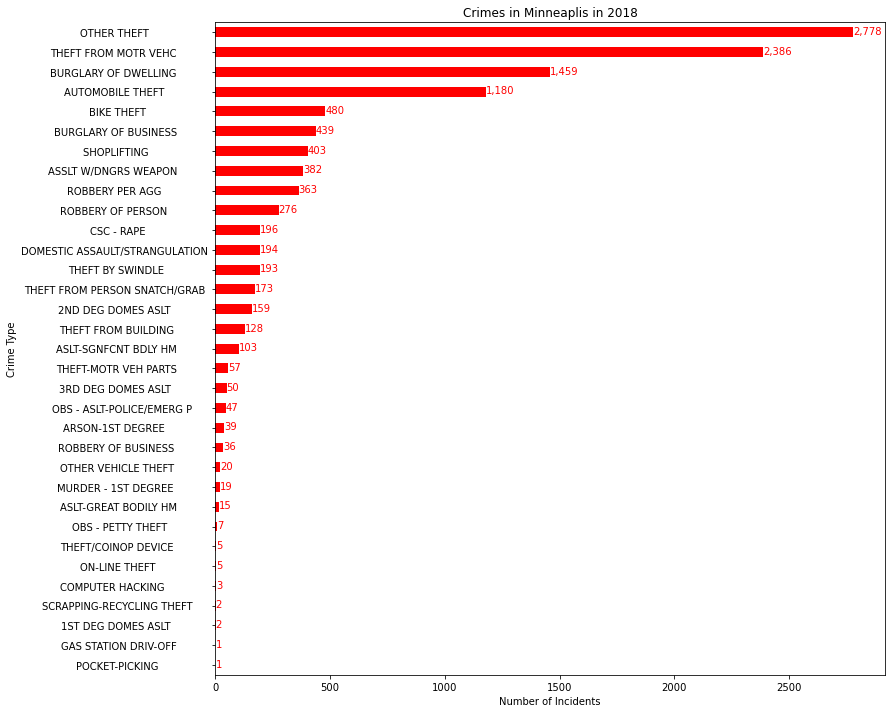

In [106]:
total.plot(kind='barh', figsize=(12,12), color='red')
for index,value in enumerate(total): 
    label = format(int(value), ',') 
    plt.annotate(label, xy=(value - 0, index - 0.10),color='red')
plt.ylabel('Crime Type')
plt.xlabel('Number of Incidents')
plt.title('Crimes in Minneaplis in 2018')
plt.show()

In [107]:
ntotal=mn.groupby('Neighborhood').size().sort_values(ascending=True)

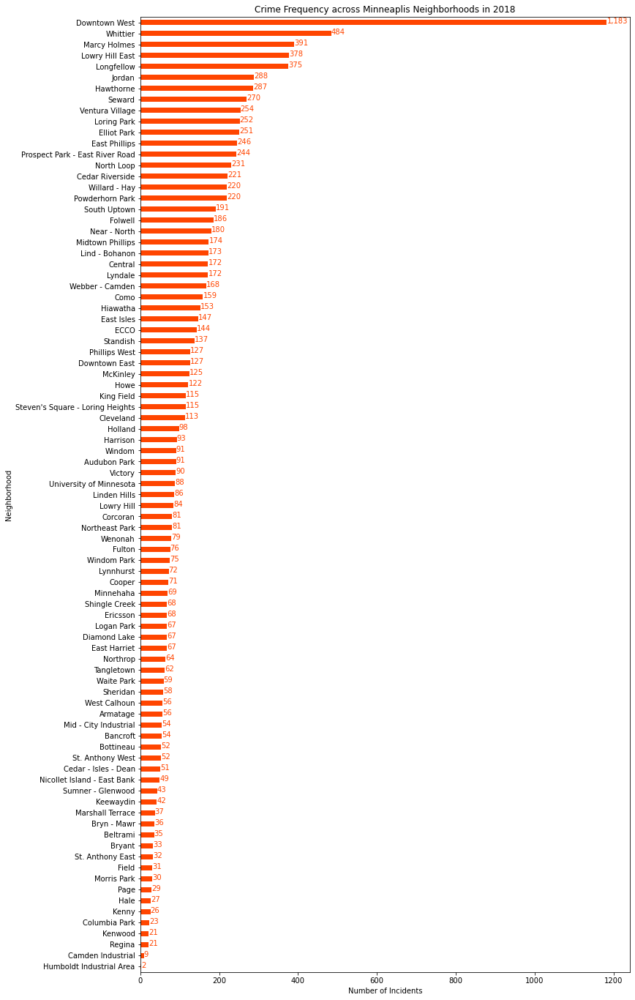

In [108]:
ntotal.plot(kind='barh', figsize=(12,24), color='orangered')
for index,value in enumerate(ntotal): 
    label = format(int(value), ',') 
    plt.annotate(label, xy=(value - 0, index - 0.10),color='orangered')
plt.ylabel('Neighborhood')
plt.xlabel('Number of Incidents')
plt.title('Crime Frequency across Minneaplis Neighborhoods in 2018')
plt.show()

Based on the 33 different types of crime frequency distribution, the most frequent crime is other theft, N=2,778. The least frequent crimes are both gas station drive off and pocket picking with N=1, respectively. The majority of crimes seem to deal with various types of theft, burglary and robbery. Based on the incident frequency across Minneapolis neighborhoods, the incidents are most frequently reported in Downtown West neighborhood with N=1,183 and least frequently in the Humboldt industrial area with N=2. Based on the crime frequency, top five relatively unsafe neighborhoods in Minneapolis are Downtown West, Whittier, Marcy Holmes, Lowry Hill East, and Longfellow. It is important to note that the incident reports in Downtown West are far worse than any other Mineeapolis neighborhoods. The frequency of incident reports are over two times more than that of the second unsafe neighborhood, Whittier, in the list. About half of the Minneapolis neighborhoods have the reported incidents above 100. 18 out of 87 neighborhoods (20%) have the reported incidents less than 50.   

The various crime frequency by Minneapolis neighborhood is depicted by heat map.

In [109]:
test=mn[['Neighborhood','description']]
gr=test.groupby(['Neighborhood','description'], as_index=False).size().to_frame()
gr.reset_index(inplace=True)
df_pivot=gr.pivot(index='Neighborhood',columns='description')
df_pivot.fillna(value=0, inplace=True)
df_pivot['total']=df_pivot.sum(axis=1)
df_pivot.sort_values(['total'], ascending=False, inplace=True)
df_pivot.drop(['total'], axis=1,inplace=True)
df_pivot.columns = df_pivot.columns.droplevel(0)
df_pivot=df_pivot.astype(int)

Text(0.5, 1.0, 'Crime Frequency by Minneapolis Neighborhood Heat Map')

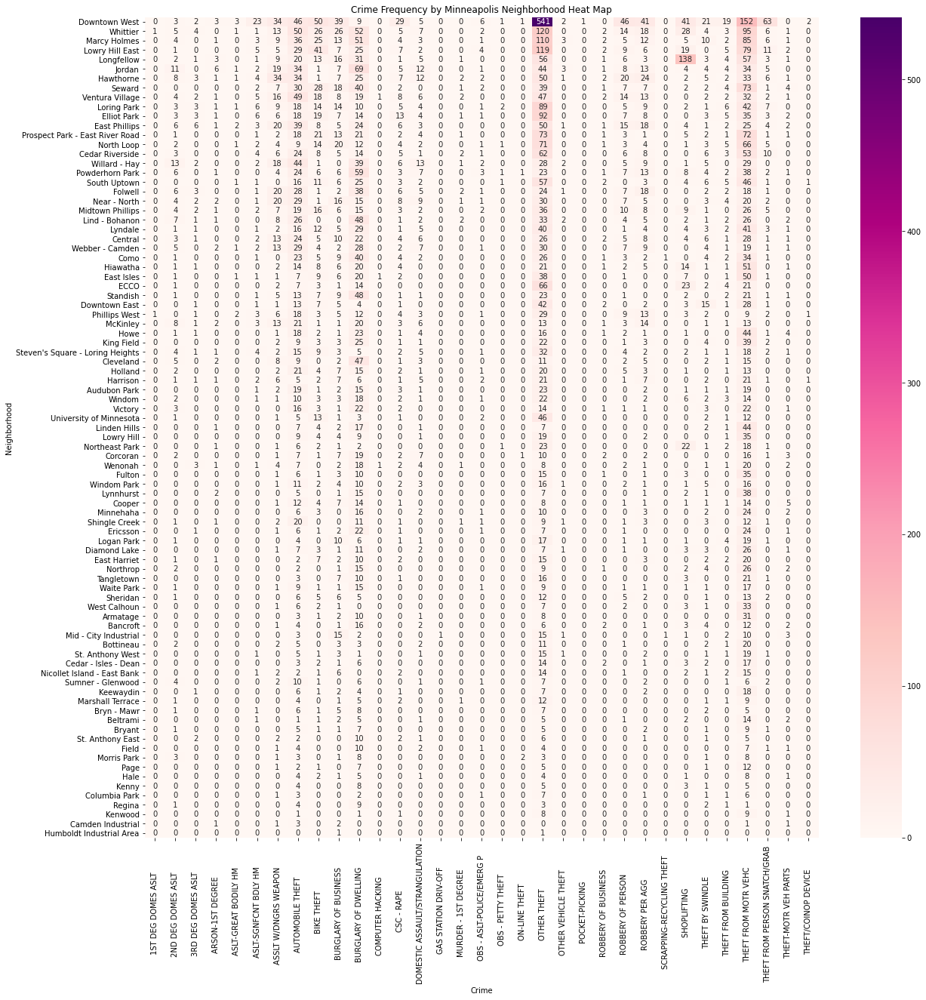

In [110]:
fig,ax=plt.subplots(figsize=(20,20))
sns.heatmap(df_pivot, cmap='RdPu', fmt='d', annot=True, ax=ax)
plt.xlabel('Crime')
plt.title('Crime Frequency by Minneapolis Neighborhood Heat Map')

In order to generate the heat map, the data is sorted with the total number of the incidents reported so that it represents the sequence of the unsafe neighborhood to safe neighborhood in Minneapolis. The heat map shows that the most frequent crime in Downtown West neighborhood is other theft with N=541 followed by theft from motor vehicles with N=152. The same trend is observed in the first four unsafe neighborhoods. The Longfellow neighborhood seems to have shoplifting as the most frequent crime which implies a shopping area. Across Minneapolis neighborhoods, ten frequent crimes obseerved are theft from motor vehicles, other theft, burglry of dwelling, burglary of business, bike theft, automobile theft, assault with dangerous weapon, robbery of person, robbery per aggression, and shoplifting. 

The Minneapolis neighborhoods' geographical information is used to create two maps,i.e., a distribution of the number of crimes by location and another magnitude of crimes per neighborhood.

In [111]:
tot=ntotal.to_frame().reset_index()
tot.rename(columns={0:'total'},inplace = True)

In [112]:
address='Minneapolis,Minnesota'
geolocator=Nominatim(user_agent='foursquare_agent')
location=geolocator.geocode(address)
latitude=location.latitude
longitude=location.longitude
print('The geograpical coordinate of Minneapolis are {},{}'.format(latitude,longitude))

The geograpical coordinate of Minneapolis are 44.9772995,-93.2654692


In [113]:
from folium import plugins
mn_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
incidents = plugins.MarkerCluster().add_to(mn_map)
for lat, lng, label, in zip(mn.latitude, mn.longitude, mn.description):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)
mn_map

In [114]:
geo=r'..input\\Minneapolis_Neighborhoods.geojson'

In [284]:
mn_map = folium.Map(location=[latitude, longitude], zoom_start=12)
folium.Choropleth(
    geo_data=geo,
    data=tot,
    columns=['Neighborhood', 'total'],
    key_on='feature.properties.BDNAME',    
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Crimes in Minneapolis Neighborhood',
    reset=True
).add_to(mn_map)
mn_map

On the first map, the distribution of the number of crimes by location is depicted. The number of crimes seem to be high at the downtown Minneapolis and its adjacent areas. On the second map, the magnitude of number of crimes at the neighborhood level is shown with the intensity of color spectrum from yellow to red, where yellow represents low number of crimes, i.e. less than 200, and red represents high number of crimes, i.e. more than 986 up to 1,183. The choropleth map shows that Downtown West neighborhood in downtown Minneapolis has the highest number of crimes. One neighborhood located in the south of downtown Minneapolis (orange color on the map), Whittier, shows the second highest number of crimes, around 500. Additional 15 neighborhoods surrounding downtown Minneapolis area have the number of crimes randing from 200 to 400. The rest of the Minneapolis neighborhoods seem to have the number of crimes less than 199. It is about 80% (87-17=70) of neighborhoods in Minneapolis.         

#### 2. Home price by Minneapolis neighborhood
The home price data is added to the Minneapolis data. Three city industrial areas that do not have home price information are dropped from the neighborhood's home price analysis. 

In [116]:
price=sites[~sites['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area'])]

In [130]:
price=pd.merge(price, tots, on='Neighborhood', how='left') 

In [131]:
price=price[['Neighborhood', 'price','total']]

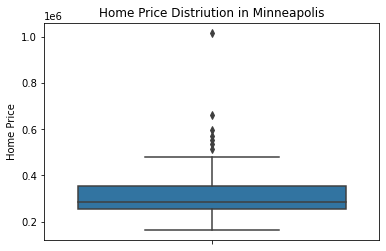

In [121]:
ponly=price[['price']]
sns.boxplot(y='price',data=ponly)
plt.title('Home Price Distriution in Minneapolis')
plt.ylabel('Home Price')
plt.show()

In [122]:
ponly.describe()

,price
count,8.400000e+01
mean,3.180107e+05
std,1.283576e+05
min,1.620000e+05
25%,2.532750e+05
50%,2.833500e+05
75%,3.529750e+05
max,1.017600e+06


The average home price in 84 Minneapolis neighborhoods is 318,000 dollars. The median home price is 353,000 dollars. The home prices in Minneapolis range from 162,000 to over 1 Million dollars. 75% of the homes are less than 353,000 dollars. The home price above 500,000 dollars seems to be outliers in Minneapolis neighborhood.   

#### 3. Relationship between crime frequency and home price 

In [123]:
pearson_coef, p_value = stats.pearsonr(price["price"], price["total"]) 
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) 

Pearson Correlation Coefficient:  -0.21946591061420942 and a P-value of: 0.04487493759012785


The obtained Pearson correlation coefficient between home price and number of crimes is -0.219 with associated p-value of 0.045 (at alpha <.05 level) which indicates a significant negative linear relationship. It means that the neighborhood with a high median home price has less frequent number of crimes. The trend can be visually inspected by the box plot, scatter plot (bubble plot) and regression plot below.     

In [154]:
price.loc[price['price'] <= (200000), 'gr']='<200K'
price.loc[(price['price'] >= (200000)) & (price['price'] <= (300000)),'gr']='200K-300K'
price.loc[(price['price'] >= (300000)) & (price['price'] <= (400000)),'gr']='300K-400K'
price.loc[(price['price'] >= (400000)) & (price['price'] <= (500000)),'gr']='400K-500K'
price.loc[(price['price'] >= (500000)) & (price['price'] <= (600000)),'gr']='500K-600K'
price.loc[price['price'] >= (600000),'gr']='>=600K'

In [155]:
price.sort_values(['price'], ascending=True, inplace=True)

In [156]:
norm=(price['total']-price['total'].min())/(price['total'].max()-price['total'].min())

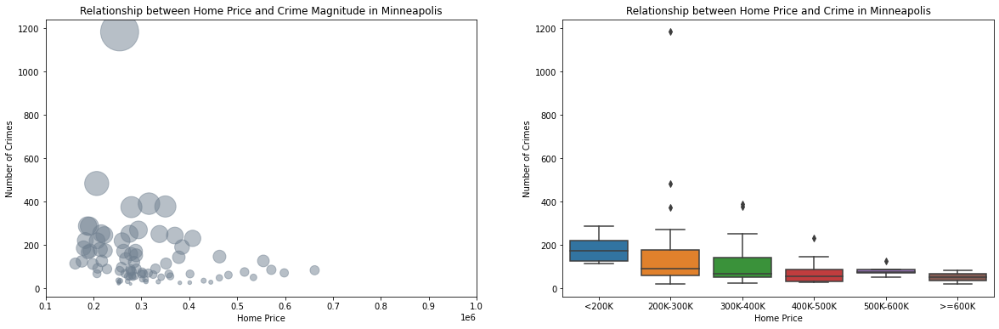

In [127]:
fig=plt.figure()
ax0=fig.add_subplot(1,2,1)
ax1=fig.add_subplot(1,2,2)
price.plot(kind='scatter',
           x='price',
           y='total',
           figsize=(20,6),
           alpha=0.5,
           color='slategrey',
           s=norm*2000+10,
           xlim=(100000,1000000), ax=ax0)
ax0.set_title('Relationship between Home Price and Crime Magnitude in Minneapolis')
ax0.set_ylabel('Number of Crimes')
ax0.set_xlabel('Home Price')

sns.boxplot(x='gr',y='total',data=price, ax=ax1)
ax1.set_title('Relationship between Home Price and Crime in Minneapolis')
ax1.set_ylabel('Number of Crimes')
ax1.set_xlabel('Home Price')
plt.show()

The neighborhoods are grouped by home price into six groups, i.e. less than 200K, 200K-300K, 300K-400K, 400K-500K, 500K-600K and above 600K. The grouped neighborhoods are used in the box plot. Based on bubble plot and box plot, the crime incidents are frequently observed in the neighborhoods with home price less than 300K dollars. The highest median number of crimes seem to be close to 200 for the neighborhoods with home price below 200K dollars, where the number of crimes range from about 150 to 300. The neighborhoods in this group has the highest interquartile range of number of crimes compared with other neighborhoods. It is followed by the neighborhoods with home price between 200K to 300K dollars where reported median number of crimes are around 100. However, the neighborhoods in this group include three neighborhoods with unusually high number of crimes, around 1200, 500 and 380, respectively. The median number of crimes seems to be around 100 for home price between 300K to 400K neighborhoods. However, it also includes a couple of high crime area with number of crimes around 400. The median number of crimes is somewhat similar across the neighborhoods with home price above 400K, which is below 100. The interquartile range of number of crimes is the tightest in the neighborhoods with home price between 500K and 600K. The lowest median number of crimes is observed to the neighborhoods with home price above 600K dollars. The range of the number of crimes seems to be within 100 incidents. Overall, the number of crimes seems to reduce as the home price goes up in Minneapolis neighborhoods. In general, Minneapolis neighborhoods with home price higher than 400K seem to be relatively safe.    

In [157]:
price.sort_values(['total'], ascending=False, inplace=True)
price['price']=price['price'].astype(int)

In [158]:
price2=price[~price['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area',
                                           'Kenwood','Downtown West','Whittier', 'Marcy Holmes', 'Lowry Hill East', 'Longfellow'])]

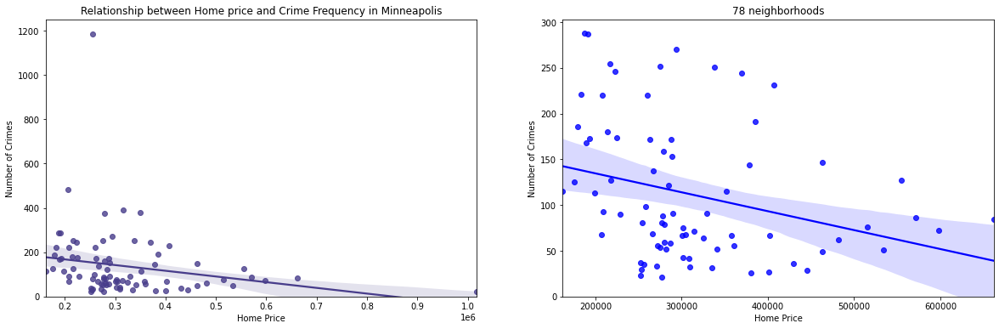

In [134]:
fig=plt.figure(figsize=(20,6))
ax0=fig.add_subplot(1,2,1)
ax1=fig.add_subplot(1,2,2)
ax0=sns.regplot(x='price', y='total', data=price, color='darkslateblue', ax=ax0)
ax0.set_title('Relationship between Home price and Crime Frequency in Minneapolis')
ax0.set_xlabel('Home Price')
ax0.set_ylabel('Number of Crimes')
ax0.set_ylim(0)
ax1=sns.regplot(x='price', y='total', data=price2, color='blue', ax=ax1)
ax1.set_title('78 neighborhoods')
ax1.set_xlabel('Home Price')
ax1.set_ylabel('Number of Crimes')
ax1.set_ylim(0)
plt.show()

The simple regression analysis shows that there is a negative relationship between number of crimes and home price which is consistent with Pearson correlation coefficent value above. Downtown West with number of crimes, N=1,183, seems to be an outlier. Also, Kenwood neighborhood with the home price over 1 million dollars seem to be an outlier. In sum, top five unsafe neighborhoods are excluded from further analysis because it is undesirable to own a rental property. Three city industrial areas are excluded because they do not have any house for sale. Finally, Kenwood neighborhood is excluded because its high home price is unfavorable for investors. That results in excluding nine neighborhoods in total. Thus, 78 neighbors are included moving forwards.   

In [135]:
pearson_coef, p_value = stats.pearsonr(price2["price"], price2["total"]) 
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) 

Pearson Correlation Coefficient:  -0.29414594489434026 and a P-value of: 0.008949261976692265


The obtained Pearson correlation coefficient between home price and number of crimes across 78 neighborhoods is -0.294 with associated p-value of 0.009 (at alpha <.05 level) which indicates a significant negative linear relationship that is a bit stronger than the previous value. 

At the exploratory analysis phase, the data is further reduced, and the final data consists of 29 features across 78 neighborhoods.

### K-MEANS
It is decided to use the K-means for neighborhood segmentation in this study to discover insights from unlabeled data, i.e. Minneapolis neighborhoods. The crime and home price data with the Foursquare neighborhood data are used for neighborhood segmentation. As mentioned, the final data used in K-Means clustering. 

In order to find the optimal number of clusters, two methods are used, i.e., the Elbow method, and Silhouette analysis. The Elbow method is to help select the optimal number of clusters by fitting the model with a range of values for K. It is a judgmental call to determine the elbow of the curve, which indicates the best fit of the underlying model at that point. Silhouette analysis shows the separation distance between the resulting clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. The Silhouette coefficient value ranges from -1 to 1. The value near 1 indicates that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

Data is normalized and checked.

In [160]:
price.sort_values('Neighborhood', inplace=True)
scale_df1=price2[~price2['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area',
                                           'Kenwood','Downtown West','Whittier', 'Marcy Holmes', 'Lowry Hill East', 'Longfellow'])]
scale_df1=scale_df1.drop(['Neighborhood','gr'],axis=1)
X1 = preprocessing.StandardScaler().fit_transform(scale_df1[['total','price']]) 

In [161]:
scale_df2=Features.drop(['total','price'],axis=1)
scale_df2=scale_df2[~scale_df2['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area',
                                           'Kenwood','Downtown West','Whittier', 'Marcy Holmes', 'Lowry Hill East', 'Longfellow'])]
scale_df2=scale_df2.drop(['Neighborhood'],axis=1)
X2 = preprocessing.StandardScaler().fit_transform(scale_df2) 

In [162]:
X=np.concatenate([scale_df1, scale_df2], axis=1)

In [163]:
sse,db,slc = {}, {}, {}
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(X)
    if k == 3: labels = kmeans.labels_
    clusters = kmeans.labels_
    sse[k] = kmeans.inertia_     
    slc[k] = silhouette_score(X,clusters)

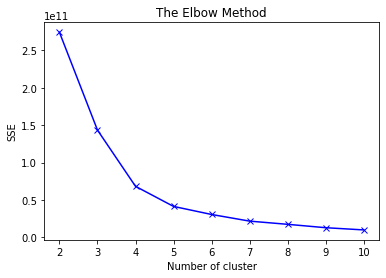

In [164]:
plt.figure(figsize=(6,4))
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.title('The Elbow Method')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [165]:
X=np.concatenate([X1, X2], axis=1)

In [166]:
np.mean(X),np.std(X)

(-1.1386902816668272e-18, 1.0)

For n_clusters = 2 The average silhouette_score is : 0.27894187602153264
For n_clusters = 3 The average silhouette_score is : 0.23027848843995138
For n_clusters = 4 The average silhouette_score is : 0.22039824826793947
For n_clusters = 5 The average silhouette_score is : 0.22735341596243472
For n_clusters = 6 The average silhouette_score is : 0.1938247314246435


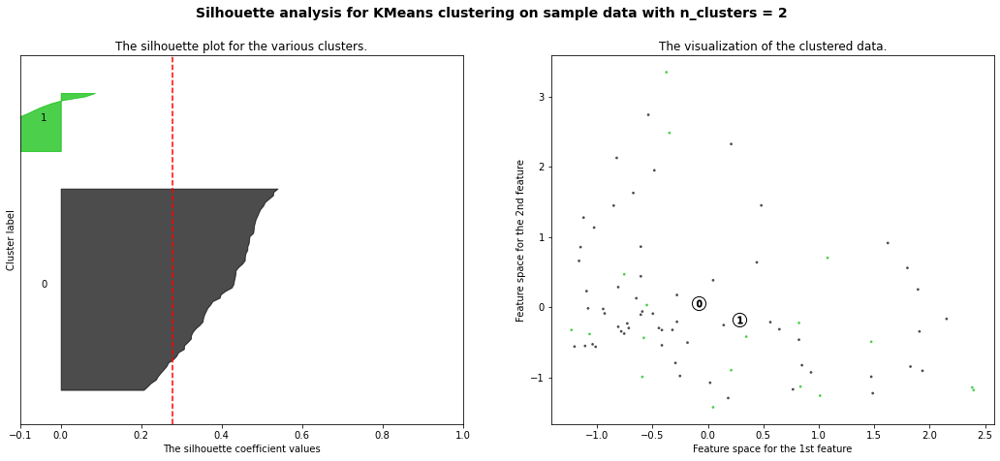

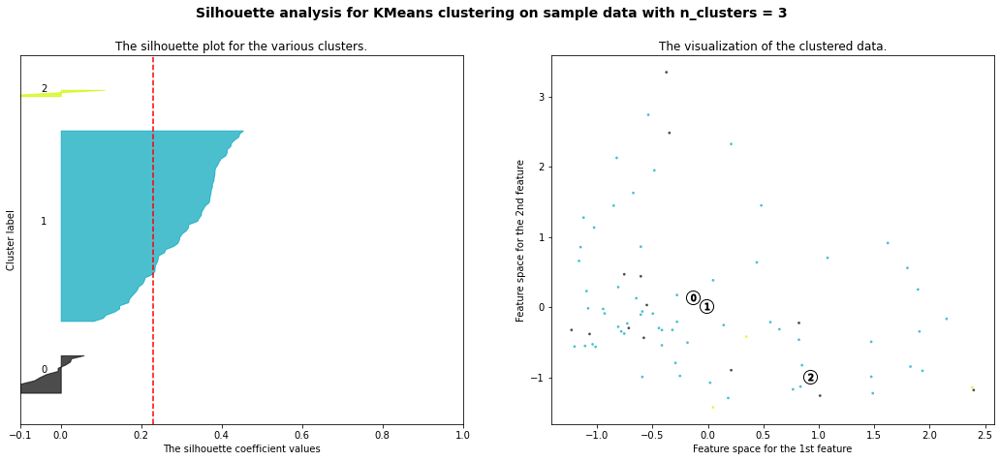

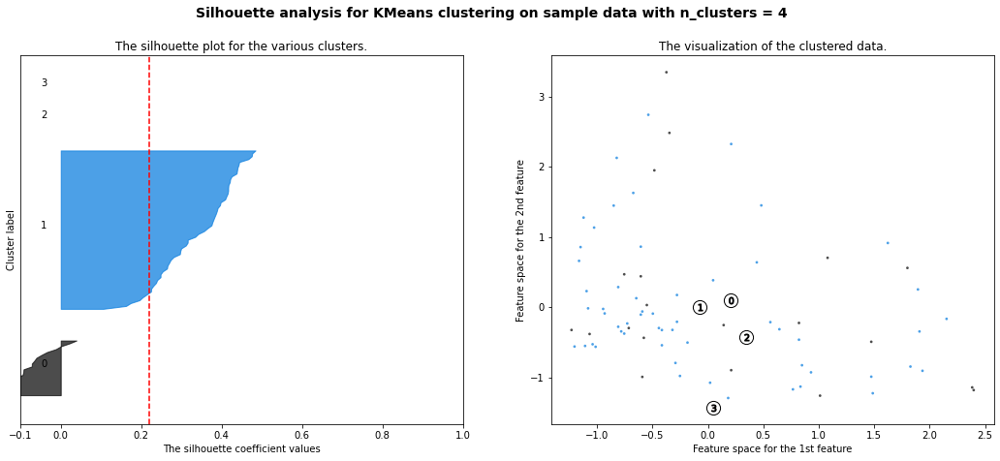

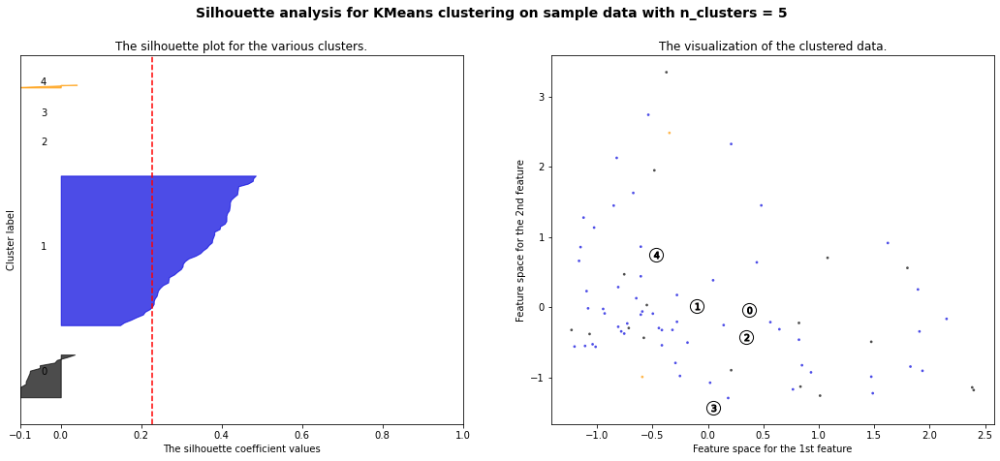

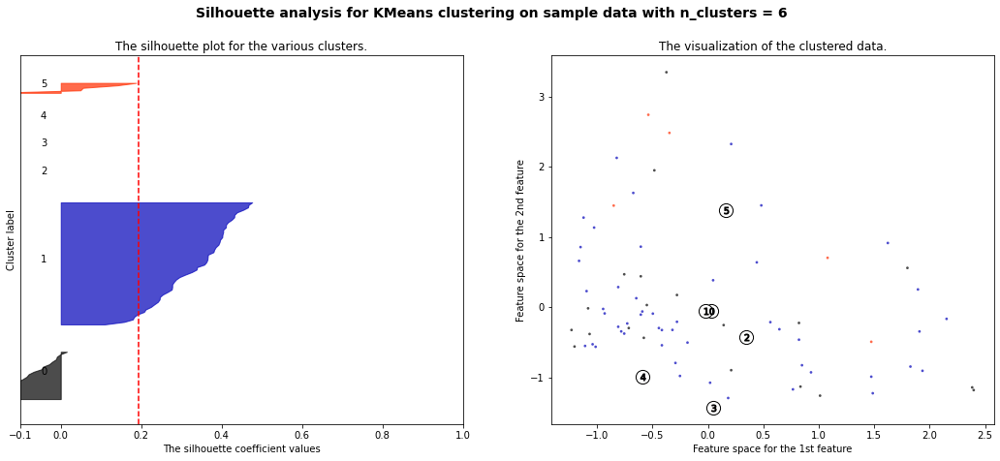

In [167]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

Based on the visual inspection, the optional K based on the Elbow method seems to suggest K=3. According to the Silhouette method, K=2 clusters seem to suggest the best fit for the underlying model. Next, K-Means clustering is performed using K=2. Then, the clustering labels are applied to the data. 

In [187]:
kclusters =2
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X)

In [214]:
neighborhoods_venues_sorted=neighborhoods_venues_sorted[~neighborhoods_venues_sorted['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area',
                                           'Kenwood','Downtown West','Whittier', 'Marcy Holmes', 'Lowry Hill East', 'Longfellow'])]

In [215]:
neighborhoods_venues_sorted.insert(0,'Cluster Labels', kmeans.labels_)

In [216]:
sitegeo=sites[~sites['Neighborhood'].isin (['Mid - City Industrial','Camden Industrial','Humboldt Industrial Area',
                                           'Kenwood','Downtown West','Whittier', 'Marcy Holmes', 'Lowry Hill East', 'Longfellow'])]
sitegeo=sitegeo[['Neighborhood','longitude','latitude']]
mn_merge=neighborhoods_venues_sorted.join(sitegeo.set_index('Neighborhood'), on = 'Neighborhood')
mn_merged=pd.merge(mn_merge, price, on='Neighborhood', how='left')
mn_merged['Cluster Labels'].value_counts()

1    63
0    15
Name: Cluster Labels, dtype: int64

In [217]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(mn_merged['latitude'], mn_merged['longitude'], mn_merged['Neighborhood'], mn_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Results
### Venues in Two Clusters: A & B

Based on the clustering results, each cluster is examined and determined the discriminating venue categories that distinguish each cluster using the top ten common venues retrieved from Foursquare API. For convenience, two clustered areas are called as A and B areas. A (N=15) and B (N=63) areas have common venues, such as restaurant, coffee shops, and gym. However, Area A includes bars and shopping areas as common venues. Having bars as a common venue is not desirable for a rental property. Area B, however, includes park and grocery stores as common venues which is desirable for a rental property.    

In [222]:
A=mn_merged.loc[mn_merged['Cluster Labels'] == 0]
A=A.drop(['longitude','latitude','price','Cluster Labels', 'gr'],axis=1)
A.apply(pd.value_counts, axis=0).sum(axis=1).sort_values(ascending=False)[:10]

Playground           5.0
Flower Shop          5.0
Grocery Store        5.0
Yoga Studio          4.0
Sandwich Place       4.0
Park                 4.0
Liquor Store         4.0
Restaurant           4.0
Food & Drink Shop    4.0
Coffee Shop          4.0
dtype: float64

In [219]:
B=mn_merged.loc[mn_merged['Cluster Labels'] == 1]
B=B.drop(['longitude','latitude','price', 'Cluster Labels','gr'],axis=1)
B.apply(pd.value_counts, axis=0).sum(axis=1).sort_values(ascending=False)[:10]

Park                    25.0
Coffee Shop             18.0
Grocery Store           18.0
American Restaurant     17.0
Fast Food Restaurant    16.0
Yoga Studio             16.0
Pizza Place             15.0
Brewery                 14.0
Liquor Store            14.0
Food Truck              14.0
dtype: float64

Next, the distance from the center of the Minneapolis to each neighborhood is computed using its latitude and longitude in order to find out the proximity of every neighborhoods. First, the neighborhoods are sorted by the distance from the center of the city. Then, potential neighborhoods for a rental property is selected based on two criteria: distance from the center of the city <= 1.5 miles and number of the crimes <=50. 

In [227]:
mn_merged.loc[:,'centlong']=longitude
mn_merged.loc[:,'centlat']=latitude

In [228]:
def dist_from_coordinates(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km

  #conversion to radians
    d_lat = np.radians(lat2-lat1)
    d_lon = np.radians(lon2-lon1)

    r_lat1 = np.radians(lat1)
    r_lat2 = np.radians(lat2)

  #haversine formula
    a = np.sin(d_lat/2.) **2 + np.cos(r_lat1) * np.cos(r_lat2) * np.sin(d_lon/2.)**2

    haversine = 2 * R * np.arcsin(np.sqrt(a)) *  0.62137 #km to Miles

    return haversine
new_column = []                    #empty column for distance
for index,row in mn_merged.iterrows():
    lat1 = row['centlat'] #first row of location.lat column here
    lon1 = row['centlong'] #first row of location.long column here
    lat2 = row['latitude'] #second row of location.lat column here
    lon2 = row['longitude'] #second row of location.long column here
    value = dist_from_coordinates(lat1, lon1, lat2, lon2)  #get the distance
    new_column.append(value)   #append the empty list with distance values

mn_merged.insert(17,"Distance",new_column)

In [251]:
A=mn_merged.loc[mn_merged['Cluster Labels'] == 0].sort_values('Distance')
A_candi=A.loc[(A['Distance']<=1.5) & (A['total']<=50)]
A_candi.shape

(0, 26)

In [230]:
B=mn_merged.loc[mn_merged['Cluster Labels'] == 1].sort_values('Distance')
B_candi=B.loc[(B['Distance']<=1.5) & (B['total']<=50)]
B_candi[['Neighborhood','price','total','Distance']]

,Neighborhood,price,total,Distance
49,Nicollet Island - East Bank,462900,49,0.715361
62,St. Anthony East,309600,32,1.350981
66,Sumner - Glenwood,302000,43,1.373221


The results show that there is no neighborhood in area A that meets the criteria but three in area B. They are St. Anthony East, Sumner-Glenwood and Nicollet Island-East Bank. Among them, Nicollet Island-East Bank is the closest from the downtown. However, the home price of Nicollet Island-East Bank neighborhood is higher than the other two, so it is eliminated from the potential neighborhoods for a rental property. Next, the surrounding neighborhoods around these two neighborhoods are further examined to determine whether these areas are safe in general. The distances are computed using the latitudes and longitudes of two potential neighborhoods, St. Anthony East and Sumner-Glenwood, respectively, to identify the adjacent neighborhoods.

### Potential neighborhoods for rental property

In [231]:
# Distance from St Anthony East:
mn_merged.loc[:,'stlong']=-93.250836
mn_merged.loc[:,'stlat']=44.993889

In [232]:
def dist_from_coordinates(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km
    d_lat = np.radians(lat2-lat1)
    d_lon = np.radians(lon2-lon1)
    r_lat1 = np.radians(lat1)
    r_lat2 = np.radians(lat2)
    a = np.sin(d_lat/2.) **2 + np.cos(r_lat1) * np.cos(r_lat2) * np.sin(d_lon/2.)**2
    haversine = 2 * R * np.arcsin(np.sqrt(a)) *  0.62137 #km to Miles
    return haversine
new_column = []                    #empty column for distance
for index,row in mn_merged.iterrows():
    lat1 = row['stlat'] #first row of location.lat column here
    lon1 = row['stlong'] #first row of location.long column here
    lat2 = row['latitude'] #second row of location.lat column here
    lon2 = row['longitude'] #second row of location.long column here
    value = dist_from_coordinates(lat1, lon1, lat2, lon2)  #get the distance
    new_column.append(value)   #append the empty list with distance values

mn_merged.insert(18,"st_Distance",new_column)

In [233]:
st=mn_merged.sort_values('st_Distance')
st_neigh=st.loc[(st['st_Distance']<=1) & (st['Neighborhood'] !='St. Anthony East')]
st_neigh[['total','st_Distance']].describe()

,total,st_Distance
count,5.000000,5.000000
mean,56.800000,0.500435
std,17.669182,0.159972
min,35.000000,0.336817
25%,49.000000,0.397487
50%,52.000000,0.424351
75%,67.000000,0.655943
max,81.000000,0.687580


Within 1 mile distance from St. Anthony East, there are 5 adjacent neighborhoods. The number of crimes ranges from 35 to 81 where the median crime frequency is 52. The whole neighborhoods are safe.

In [234]:
# Distance from Sumner-Glenwood:
mn_merged.loc[:,'sglong']=-93.292480
mn_merged.loc[:,'sglat']=44.982773

In [235]:
def dist_from_coordinates(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km
    d_lat = np.radians(lat2-lat1)
    d_lon = np.radians(lon2-lon1)
    r_lat1 = np.radians(lat1)
    r_lat2 = np.radians(lat2)
    a = np.sin(d_lat/2.) **2 + np.cos(r_lat1) * np.cos(r_lat2) * np.sin(d_lon/2.)**2
    haversine = 2 * R * np.arcsin(np.sqrt(a)) *  0.62137 #km to Miles
    return haversine
new_column = []                    #empty column for distance
for index,row in mn_merged.iterrows():
    lat1 = row['sglat'] #first row of location.lat column here
    lon1 = row['sglong'] #first row of location.long column here
    lat2 = row['latitude'] #second row of location.lat column here
    lon2 = row['longitude'] #second row of location.long column here
    value = dist_from_coordinates(lat1, lon1, lat2, lon2)  #get the distance
    new_column.append(value)   #append the empty list with distance values

mn_merged.insert(19,"sg_Distance",new_column)

In [236]:
sg=mn_merged.sort_values('sg_Distance')
sg_neigh=sg.loc[(sg['sg_Distance']<=1) & (sg['Neighborhood'] !='Sumner - Glenwood')]
sg_neigh[['total','sg_Distance']].describe()

,total,sg_Distance
count,5.000000,5.000000
mean,176.000000,0.885150
std,80.761996,0.175825
min,84.000000,0.573034
25%,93.000000,0.939206
50%,220.000000,0.945010
75%,231.000000,0.977345
max,252.000000,0.991154


Within 1 mile distance from Sumner - Glenwood, there are 5 adjacent neighborhoods. The number of crimes ranges from 84 to 252 where the median crime frequency is 220. This neighborhood is not as safe as St. Anthony East neighborhood. **Therefore, the best neighborhood to own a rental property in Minneapolis neighborhood is St. Anthony East neighborhood.**

## Discussion
### St. Anthony East neighborhood

In [237]:
st_venues=mn_venues.loc[mn_venues['Neighborhood']=='St. Anthony East']

In [238]:
st_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1256,St. Anthony East,44.993889,-93.250836,Spring Street Tavern,44.994857,-93.252089,Dive Bar
1257,St. Anthony East,44.993889,-93.250836,Lu's Sandwiches,44.989861,-93.252446,Vietnamese Restaurant
1258,St. Anthony East,44.993889,-93.250836,Eli's East Food & Cocktails,44.991302,-93.247344,American Restaurant
1259,St. Anthony East,44.993889,-93.250836,Brasa Premium Rotisserie,44.989493,-93.251334,BBQ Joint
1260,St. Anthony East,44.993889,-93.250836,Red Stag Supperclub,44.990364,-93.253614,Breakfast Spot


In [240]:
stm = folium.map.FeatureGroup()
#st_map = folium.Map(location=[44.993889, -93.250836], zoom_start=16)

# loop through the 100 crimes and add each to the incidents feature group
for lat, lon in zip(st_venues['Venue Latitude'], st_venues['Venue Longitude']):
    stm.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(st_venues['Venue Latitude'])
longitudes = list(st_venues['Venue Longitude'])
labels = list(st_venues['Venue Category'])

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(st_map)    
    
# add incidents to map
st_map.add_child(stm)

In [248]:
st_venues=st_venues.sort_values('Venue Category')
st_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1258,St. Anthony East,44.993889,-93.250836,Eli's East Food & Cocktails,44.991302,-93.247344,American Restaurant
1267,St. Anthony East,44.993889,-93.250836,Domo Gastro,44.994780,-93.247994,Asian Restaurant
1268,St. Anthony East,44.993889,-93.250836,Beast Barbecue,44.991471,-93.246952,BBQ Joint
1259,St. Anthony East,44.993889,-93.250836,Brasa Premium Rotisserie,44.989493,-93.251334,BBQ Joint
1260,St. Anthony East,44.993889,-93.250836,Red Stag Supperclub,44.990364,-93.253614,Breakfast Spot
1265,St. Anthony East,44.993889,-93.250836,The Herbivorous Butcher,44.990265,-93.253690,Butcher
1256,St. Anthony East,44.993889,-93.250836,Spring Street Tavern,44.994857,-93.252089,Dive Bar
1262,St. Anthony East,44.993889,-93.250836,Moose on Monroe Bar & Grill,44.994759,-93.252826,Dive Bar
1266,St. Anthony East,44.993889,-93.250836,Glam Doll Donuts,44.989583,-93.252664,Donut Shop
1272,St. Anthony East,44.993889,-93.250836,White Castle,44.989909,-93.251876,Fast Food Restaurant


In [249]:
st_venues.shape

(21, 7)

According to Foursquare location data, St. Anthony East neighborhood contains 21 different venues. As seen in the map above, many of venues are close each other. The neighborhood offers seven different restaurants including one fast food restaurant, 3 bars, 2 music venues, 2 karaoke bars, a donut shop, a butcher, a park and a skate park. **It is surprising to find that the neighborhood has low crime rates even though it has 3 bars and 2 music venues. However, the neighborhood seems to be suited for a young adult or visitors rather than a family.** 

The overall ratings of restaurants are reviewed via Foursquare API. 

In [277]:
search_query = 'Supperclub'
latitude=44.993889
longitude=-93.250836	
radius=500
limit=30
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/search?client_id=BKE1YJCDPI3HXAFCBTIXABSYCDPP5R23AJVYBWCKZWNDOH4T&client_secret=2VE41LNH40YKJ5UUGBABY2J25PA2ZT1H3LTKDQFSYOAI1OXV&ll=44.993889,-93.250836&v=20200602&query=Supperclub&radius=500&limit=30'

In [278]:
results=requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ed6b968c8cff2001be0960a'},
 'response': {'venues': [{'id': '48f5e54af964a52046521fe3',
    'name': 'Red Stag Supperclub',
    'location': {'address': '509 1st Ave NE',
     'crossStreet': 'btw 5th St NE & 6th St NE',
     'lat': 44.990364372473856,
     'lng': -93.25361393212677,
     'labeledLatLngs': [{'label': 'display',
       'lat': 44.990364372473856,
       'lng': -93.25361393212677}],
     'distance': 449,
     'postalCode': '55413',
     'cc': 'US',
     'city': 'Minneapolis',
     'state': 'MN',
     'country': 'United States',
     'formattedAddress': ['509 1st Ave NE (btw 5th St NE & 6th St NE)',
      'Minneapolis, MN 55413',
      'United States']},
    'categories': [{'id': '4bf58dd8d48988d143941735',
      'name': 'Breakfast Spot',
      'pluralName': 'Breakfast Spots',
      'shortName': 'Breakfast',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/breakfast_',
       'suffix': '.png'},
      'primary': True}],

In [262]:
venue_id = '48187e17f964a5206f4f1fe3' # ID of Brasa Premium Rotisserie
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

8.8


In [267]:
venue_id = '5c56293628374e002c17df3d' # ID of Beast Barbecue
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

6.9


In [270]:
venue_id = '564fbcb6498ed9e5c8dd6ac4' # ID of Domo Gastro
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

6.7


In [276]:
venue_id = '577fd064498e818708735810' # ID of Lu's sandwitch
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

8.8


In [279]:
venue_id = '48f5e54af964a52046521fe3' # ID of Red Stag Supperclub
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

8.4


In [273]:
venue_id = '5855d840ce593d5304f96945' # ID of Glam Doll Donuts
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)

result = requests.get(url).json()
try:
    print(result['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

7.8


The overall ratings of the restaurants in St. Anthony East neighborhood are reviewed via Foursquare API. The ratings are 8.8 for Brasa Premium Rotisserie, 6.9 for Beast Barbecue, 6.7 for Domo Gastro, 8.8 for Lu's sandwich, 8.4 for Red Stag Supper club, and 7.8 for Glam Doll Donuts. This area offers two good breakfast options as well as nice restaurants with high ratings. **It concludes that it is a nice place to be.** 

**As a final point, it is recommended to own a rental property in St. Anthony East neighborhood which is away from bars, music venues, train, roads, commercial properties and electric machinery due to noise and traffic (see the map above). If possible, it would be best that a rental property can be located in a residential area.**   .   

## Conclusion

This study is an attempt to identify the best neighborhood in Minneapolis to own a rental property among 87 neighborhoods. The safety measure via crime rates, home price in each neighborhood, and proximity to the downtown are the main characteristics to pinpoint the best neighborhood to invest in, namely, St. Anthony East neighborhood. St. Anthony East neighborhood is close to downtown (about 1.35 miles from downtown). The home price in this neighborhood is around 300K which is the lower end of the price point in Minneapolis. It is one of the safest neighborhoods in Minneapolis. In addition, it offers various venues to accommodate the different lifestyle. Indeed, it is nice place to live. It is the best Minneapolis neighborhood for investors to own a rental property. 

It is noted that the neighborhood clustering results via K-Means clustering are rather ambiguous. It is hard to uncover what are the deciding factors for two clustered areas. It is possible that the Minneapolis neighborhoods are very similar indeed so it may be difficult to sort it out. It is suggested that the future study can be done including more data, such as ethnicity, gender, employment status, and school performance, to distinguish the neighborhoods better. 
